<img src="https://raw.githubusercontent.com/SeaGraphData/GSE-Planet-Tasks/main/Images/Graz.jpg" width="900"/>

<center>Graz (Austria)</center>
<br>

# <center>Dekadal NDVI Composite Pipeline from Sentinel-2 L2A</center>

<center>
Contact Author: Juan Fernandez – 
<a href="mailto:juan.fernandez.sea@gmail.com">juan.fernandez.sea@gmail.com</a>
</center>
<br>
<br>

This Python-based pipeline generates 10-day (dekadal) NDVI composite products from Sentinel-2 L2A satellite imagery. Designed for environmental and agricultural monitoring, it solves a challenge: satellite revisit cycles are irregular (every 5-7 days), but standard reporting periods like the 1st, 11th, and 21st of each month require data on exact dates.

The core of the solution is a **temporal interpolation method**. The pipeline accesses data via the [Copernicus Data Space Ecosystem (CDSE)](https://dataspace.copernicus.eu/), applies cloud and shadow masking using the Scene Classification Layer (SCL), and then uses an Inverse Distance Weighting (IDW) algorithm. This algorithm intelligently estimates the NDVI for the exact target dekadal date by blending the nearest available clear-sky observations from before and after that date, ensuring a continuous, gap-free time series.


## Table of Contents
1. [Prerequisites](#prerequisites)
2. [Introduction](#introduction)
3. [Understanding Data Structure](#understanding-data-structure)
4. [NDVI Interpolation](#cloud-free-true-color-mosaics)
5. [Results as Geospatial Files](#summary)



## Prerequisites

To carry out this notebook you need the following requisites:

- [Basic Knowledge of Remote Sensing](https://business.esa.int/newcomers-earth-observation-guide)

- [Basic Familiarity with Sentinel Hub](https://www.sentinel-hub.com/explore/education/webinars/)




### Registering OAuth client to obtain the Client ID & Client Secret

To register an OAuth client, open the “User Settings” tab in the Dashboard app and locate the “OAuth clients” section. Click on the Create button (1). Provide a name for your OAuth client (2). You can select the Expiry date for your client (3) or select “Never expire” if you want your OAuth client to be indefinite (4). For OAuth clients without expiration you will need to confirm your understanding of risks (5). If your OAuth client will be used by a single-page application (SPA), select the corresponding option (6). If the SPA option is selected, you'll be prompted to choose between "Allow all domains" (7) or specify the web origins (8) from which the OAuth Client will be used. Confirmation is required if you selected to use the OAuth client in a frontend application, acknowledging the risks of exposure (9).

Once all mandatory fields are filled, proceed by clicking the Create button (10).

Your client ID and client secret will be displayed. You may now copy both client ID and the client secret (11). Ensure to copy the secret value and paste it securely as it won’t be retrievable once the pop-up closes! After copying, click Close(12). With the client ID and client secret in hand, you are now prepared to request tokens.

Upon completion, you’ll find your newly created OAuth client with its corresponding ID and name (13) listed under the “OAuth clients” section.

<img src="https://raw.githubusercontent.com/SeaGraphData/GSE-Planet-Tasks/main/Images/create_oauth_client_cdse.png" width="800"/>

<center>Registration of an OAuth client</center>
<br>

## Introduction

<br>

The imported libraries cover three main areas: general-purpose Python utilities, numerical and visualization tools, and geospatial libraries required to handle raster data and spatial geometries.

The Sentinel Hub Python package plays a central role in this workflow. It is used to authenticate against the Copernicus Data Space Ecosystem, define spatial and temporal request parameters, and retrieve Sentinel-2 imagery programmatically. A dedicated `SHConfig()` object is created to store the authentication credentials required by the API.

In addition to authentication, several project-level defaults are defined to ensure consistent behavior throughout the notebook. These include the maximum acceptable cloud coverage for scene selection, the output image dimensions controlling spatial resolution, and a dedicated NoData value used to flag invalid or missing pixels during processing.


The next step defines the geographic region over which the NDVI analysis will be performed. In this example, the Area of Interest (AOI) corresponds to the city of Graz, Austria.


The AOI is described as a polygon using geographic coordinates in longitude–latitude order (WGS84). These coordinates define the spatial footprint that will be queried when requesting Sentinel-2 imagery from Sentinel Hub.


A Shapely `Polygon` is first created from the coordinate list. This representation is convenient for validating the geometry and for extracting basic spatial properties such as the bounding box.


The polygon is then converted into a `sentinelhub.Geometry` object, which is the geometry format required by the `SentinelHubRequest` API. The coordinate reference system is explicitly set to **WGS 84 (EPSG:4326)**, ensuring consistency with the Sentinel Hub service.


As a simple sanity check, the AOI bounding box is printed in the form `(min_lon, min_lat, max_lon, max_lat)`. This helps confirm that the spatial extent has been defined correctly before proceeding with data requests.


In [1]:
# Cell 1 - imports & config
from pprint import pprint
import json
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
from dateutil import parser as dateparse
import os

# sentinelhub / geospatial libs
from sentinelhub import (
    CRS,
    DataCollection,
    DownloadFailedException,
    Geometry,
    MimeType,
    SentinelHubRequest,
    SHConfig,
)

# extras
import rasterio
from rasterio.transform import from_bounds
from rasterio.crs import CRS as rioCRS
from shapely.geometry import Polygon, mapping

# Notebook display tweaks
plt.rcParams["figure.dpi"] = 120

# Sentinel Hub / CDSE config (your credentials)
config = SHConfig()
config.sh_client_id = "<Type here your Client ID>"
config.sh_client_secret = "< Type Client Secret ID>"
config.sh_base_url = "https://sh.dataspace.copernicus.eu"
config.sh_token_url = "https://identity.dataspace.copernicus.eu/auth/realms/CDSE/protocol/openid-connect/token"

# Useful defaults
MAX_CLOUD_COVER = 0.8    # keep scenes up to 80% cloud coverage (0.0-1.0)
OUT_SIZE = (1000, 1000)  # output pixels (width, height)
NODATA_VALUE = -9999.0   # used in evalscripts / output


In [2]:
# Cell 2 - AOI definition (shapely + sentinelhub Geometry)
# Replace coordinates if you want a different AOI.

# Graz tile example polygon (lon, lat) -- same as you used previously
coords = [
    (15.272166, 46.967134),
    (15.616379, 46.967134),
    (15.616379, 47.11383),
    (15.272166, 47.11383),
    (15.272166, 46.967134),
]

# Create shapely polygon (useful for bounds / raster transform)
aoi_shapely = Polygon(coords)

# Create sentinelhub.Geometry for requests
aoi = Geometry(mapping(aoi_shapely), CRS.WGS84)

# Sanity print
print("AOI bounds (WGS84):", aoi_shapely.bounds)


AOI bounds (WGS84): (15.272166, 46.967134, 15.616379, 47.11383)


## Understanding Data Structure

This part defines the `request_helper` function, which serves as the central utility for all interactions with the Copernicus Data Space Ecosystem (CDSE) API.

**What it does:**
This function abstracts the complexity of building a `SentinelHubRequest`. It packages the user's parameters—such as the processing script (`evalscript`), time period, and area of interest—into a standardized request that is sent to the CDSE servers for processing. The heavy computational work of applying the script to satellite data is performed in the cloud, and only the final result is downloaded to your notebook.

**Key Parameters:**
*   `evalscript`: The most critical parameter. This is a JavaScript code that defines precisely how to process the satellite data (e.g., calculating NDVI, masking clouds) for every pixel.
*   `start_date` / `end_date`: Defines the temporal window for the analysis.
*   `geometry`: The Area of Interest (AOI), provided as a Sentinel Hub `Geometry` object.
*   `size`: The dimensions `(width, height)` of the output image in pixels, determining its spatial resolution.

The function configures the request to use the **Sentinel-2 L2A** data collection (which provides atmospherically corrected surface reflectance), applies the user-defined cloud cover filter (`maxcc`), and specifies that the output should be delivered as a GeoTIFF image.
<br>


**Part 1: Inspecting the `samples` structure**

The first evalscript (`samples_evalscript`) is configured with `mosaicking: "TILE"`. This mode provides, for a single geographic pixel location, an array of observations from **all different satellite acquisitions** within the requested time period.

When executed, the script throws the `samples` array. In Python, we catch this error, extract the JSON string, and parse it. The printed output shows what data is available per observation:

*   It reveals the spectral band values (e.g., `B04` for Red, `B02` for Blue) for each acquisition date.
*   It shows the `SCL` (Scene Classification Layer) value, which is key for identifying clouds, shadows, and valid land pixels.
*   It confirms the `dataMask`, which indicates if valid data exists for that pixel/date.

Each entry in the printed list corresponds to a different satellite pass over your AOI. This structure is what allows for multi-temporal analysis, such as picking the clearest observation or performing temporal interpolation.
<br>

**Part 2: Inspecting the `scenes.tiles` metadata**

The second evalscript (`scenes_evalscript`) accesses a different piece of information: the `scenes` context. This object contains metadata about the satellite data tiles being processed, not the pixel values themselves.

The script specifically throws `scenes.tiles`. When parsed in Python, this provides a list of metadata for each Sentinel-2 tile (image granule) that intersects with your AOI and time period.

**Key information in the output includes:**
*   `date`: The precise acquisition time of the scene.
*   `cloudCoverage`: The percentage of cloud cover in the tile, which is used for filtering via the `maxcc` parameter.
*   `productId`: The unique identifier of the Sentinel-2 product.

Inspecting `scenes.tiles` confirms that the API is finding the correct satellite images and allows you to verify the dates and cloud cover statistics that will feed into your composite.

In [3]:
# Cell 3 - request helper
def request_helper(evalscript, start_date="2025-08-01", end_date="2025-08-30", geometry=aoi, size=OUT_SIZE):
    """
    Perform a SentinelHubRequest for a given evalscript and time interval.
    Returns the data returned by request.get_data()
    """
    request = SentinelHubRequest(
        evalscript=evalscript,
        input_data=[
            SentinelHubRequest.input_data(
                data_collection=DataCollection.SENTINEL2_L2A.define_from(
                    "sentinel-2-l2a", service_url=config.sh_base_url
                ),
                time_interval=(start_date, end_date),
                maxcc=MAX_CLOUD_COVER,
            )
        ],
        responses=[SentinelHubRequest.output_response("default", MimeType.TIFF)],
        geometry=geometry,
        size=size,
        config=config,
    )
    return request.get_data()


In [4]:
# Cell 4 
samples_evalscript = """
//VERSION=3
function setup() {
    return {
        input: ["B04", "B03", "B02", "SCL", "dataMask"],
        output: {
            bands: 1,
            sampleType: "FLOAT32",
        },
        mosaicking: "TILE"
    };
}

function evaluatePixel(samples) {
    // Throw the samples structure to the error message so we can inspect it in Python
    throw new Error(JSON.stringify(samples))
}
"""

try:
    request_helper(samples_evalscript, start_date="2025-08-01", end_date="2025-08-30", geometry=aoi, size=(200,200))
except DownloadFailedException as e:
    em = json.loads(e.__cause__.response.text)["error"]["message"]
    # Extract JSON array from the error message (the notebook trick you used)
    error_start = em.find("Error: [")
    if error_start != -1:
        json_start = error_start + 7  # Skip "Error: "
        bracket_count = 0
        json_end = json_start
        for i in range(json_start, len(em)):
            if em[i] == "[":
                bracket_count += 1
            elif em[i] == "]":
                bracket_count -= 1
                if bracket_count == 0:
                    json_end = i + 1
                    break

        samples_json = em[json_start:json_end]
        samples = json.loads(samples_json)
        print("Found samples examples (first 12 entries):")
        pprint(samples[:12])
    else:
        print("Couldn't parse sample structure from error message.")


Found samples examples (first 12 entries):
[{'B02': 0.51, 'B03': 0.4716, 'B04': 0.4404, 'SCL': 9, 'dataMask': 1},
 {'B02': 0, 'B03': 0, 'B04': 0, 'SCL': 0, 'dataMask': 0},
 {'B02': 0.033,
  'B03': 0.057800000000000004,
  'B04': 0.037000000000000005,
  'SCL': 4,
  'dataMask': 1},
 {'B02': 0, 'B03': 0, 'B04': 0, 'SCL': 0, 'dataMask': 0},
 {'B02': 0, 'B03': 0, 'B04': 0, 'SCL': 0, 'dataMask': 0},
 {'B02': 0.058300000000000005,
  'B03': 0.0648,
  'B04': 0.049600000000000005,
  'SCL': 10,
  'dataMask': 1},
 {'B02': 0.031, 'B03': 0.0603, 'B04': 0.0403, 'SCL': 4, 'dataMask': 1},
 {'B02': 0, 'B03': 0, 'B04': 0, 'SCL': 0, 'dataMask': 0},
 {'B02': 0, 'B03': 0, 'B04': 0, 'SCL': 0, 'dataMask': 0},
 {'B02': 0, 'B03': 0, 'B04': 0, 'SCL': 0, 'dataMask': 0},
 {'B02': 0.037700000000000004,
  'B03': 0.06330000000000001,
  'B04': 0.0463,
  'SCL': 4,
  'dataMask': 1},
 {'B02': 0.0333,
  'B03': 0.061500000000000006,
  'B04': 0.0459,
  'SCL': 4,
  'dataMask': 1}]


In [5]:
scenes_evalscript = """
//VERSION=3
function setup() {
    return {
        input: ["B04", "B03", "B02", "SCL", "dataMask"],
        output: {
            bands: 1,
            sampleType: "FLOAT32",
        },
        mosaicking: "TILE"
    };
}

function evaluatePixel(samples, scenes) {
    throw new Error(JSON.stringify(scenes.tiles))
    return
}
"""

try:
    request_helper(scenes_evalscript, start_date="2025-08-01", end_date="2025-08-30")
except DownloadFailedException as e:
    em = json.loads(e.__cause__.response.text)["error"]["message"]
    # Extract the JSON array from the error message
    error_start = em.find("Error: [")
    if error_start != -1:
        json_start = error_start + 7  # Skip "Error: "
        # Find the end of the JSON array
        bracket_count = 0
        json_end = json_start
        for i in range(json_start, len(em)):
            if em[i] == "[":
                bracket_count += 1
            elif em[i] == "]":
                bracket_count -= 1
                if bracket_count == 0:
                    json_end = i + 1
                    break

        scenes_json = em[json_start:json_end]
        scenes = json.loads(scenes_json)
        pprint(scenes)

[{'__idx': 0,
  'cloudCoverage': 70.35,
  'dataPath': 'creo://EODATA/Sentinel-2/MSI/L2A/2025/08/29/S2A_MSIL2A_20250829T100041_N0511_R122_T33TWN_20250829T121701.SAFE/GRANULE/L2A_T33TWN_A053201_20250829T100724/IMG_DATA/RRESOLUTION/T33TWN_20250829T100041_TILEBAND_RESOLUTION',
  'date': '2025-08-29T10:07:48.513Z',
  'productId': 'S2A_MSIL2A_20250829T100041_N0511_R122_T33TWN_20250829T121701.SAFE',
  'sentinel2ProductId': 'S2A_MSIL2A_20250829T100041_N0511_R122_T33TWN_20250829T121701.SAFE',
  'shId': 55059957},
 {'__idx': 1,
  'cloudCoverage': 53.55,
  'dataPath': 'creo://EODATA/Sentinel-2/MSI/L2A/2025/08/29/S2B_MSIL2A_20250829T095029_N0511_R079_T33TWN_20250829T121329.SAFE/GRANULE/L2A_T33TWN_A044292_20250829T095654/IMG_DATA/RRESOLUTION/T33TWN_20250829T095029_TILEBAND_RESOLUTION',
  'date': '2025-08-29T09:57:38.087Z',
  'productId': 'S2B_MSIL2A_20250829T095029_N0511_R079_T33TWN_20250829T121329.SAFE',
  'sentinel2ProductId': 'S2B_MSIL2A_20250829T095029_N0511_R079_T33TWN_20250829T121329.SAFE',
 

## Temporal Interpolation for Dekadal NDVI

This section defines the heart of the project: the pipeline that generates NDVI values for fixed dekadal dates (1st, 11th, 21st of the month) despite irregular satellite observations. The core challenge is that satellites like Sentinel-2 don't capture images every day over a given location; they have a revisit cycle of about 5 days. This means there might not be a clear, cloud-free image on the exact target date.

We solve this by implementing a temporal interpolation scheme. Instead of looking for an image on the exact date, we collect all usable observations within a window around the target date (e.g., ±5 days) and mathematically estimate what the NDVI *would have been* on that date.


**Mathematical Formulation of IDW Interpolation**

The mathematical model used is Inverse Distance Weighting (IDW) applied in the time domain [1][2][3]. The core principle is that observations closer in time to the target date should have more influence on the estimated value than those further away. For a target dekadal date $t_{target}$, we have $n$ valid NDVI observations at times $t_i$, with values $v_i$. The interpolated NDVI value $V$ is calculated as a weighted average:

$$
V(t_{target}) = \frac{\sum_{i=1}^{n} w_i \cdot v_i}{\sum_{i=1}^{n} w_i}
$$

where the weight $w_i$ for each observation is inversely proportional to its temporal distance from the target:

$$
w_i = \frac{1}{d(t_i, t_{target})^p + \epsilon}
$$

In our implementation:
- $d(t_i, t_{target})$ is the absolute difference in days.
- The power parameter $p$ is set to 1 (standard IDW).
- A small constant $\epsilon$ (0.1) is added to the denominator to prevent division by zero.


The evalscript in `request_dekadal_ndvi()` implements this logic. It gathers all clear-sky NDVI values within an 8-day window, calculates their temporal distance, and computes the weighted average, prioritizing the 3 nearest observations.
<br>

The next cells executes the interpolation pipeline and provides the first visual and quantitative assessment of the results.

**What it does:**
1.  **Executes the Pipeline**: Calls `request_dekadal_ndvi()`, which makes three separate requests to the CDSE API—one for each dekadal period (Aug 1, 11, 21). For each request, the custom evalscript performs the on-the-fly IDW interpolation described above.
2.  **Visualizes Results**: Creates a figure with three subplots, each displaying the interpolated NDVI composite for one dekad. The colormap "YlGn" (Yellow-Green) is ideal for representing vegetation health.
3.  **Prints Quality Metrics**: For each dekad, it calculates key statistics:
    *   **Valid Pixel Coverage**: The percentage of pixels for which the interpolation could find at least one valid observation in the search window. This is a direct measure of data availability after cloud masking.
    *   **NDVI Range and Mean**: Provides a summary of the vegetation signal for the period.

The `dekadal_ndvi` dictionary stores the raw, temporally interpolated results. These images may still contain `NaN` values in areas where no valid observations were found in any of the scenes within the search window (e.g., persistent cloud cover).
<br>

The temporal interpolation in Cell 8 solves the *when* problem. However, some pixels might remain empty (`NaN`) if, for example, a persistent cloud covered a specific field for the entire two-week search window. This cell addresses the *where* problem through spatial interpolation.

**Two-Step Spatial Process:**

1.  **Nearest-Neighbor Gap Filling**: For each pixel that is `NaN`, the algorithm finds the geographically closest valid pixel and adopts its value. This is implemented efficiently using a distance transform (`scipy.ndimage.distance_transform_edt`). This step ensures all pixels have a value, but can create sharp, blocky artifacts where large gaps are filled.

2.  **Gaussian Smoothing for Artifact Reduction**: To soften the hard edges introduced by nearest-neighbor filling, a Gaussian filter is applied. Crucially, this smoothing is applied *only* to the pixels that were originally filled, preserving the original, reliable data values everywhere else. The final output is a seamless, gap-free NDVI map.

**Mathematical Note on Gaussian Filtering**

A Gaussian filter blends a pixel's value with its neighbors, weighted by a Gaussian (bell-shaped) curve. The intensity of smoothing is controlled by the parameter `sigma` (σ=0.5 in our code). A larger σ creates more blending. The operation is a form of onvolution between the image and a Gaussian kernel.

The final output, `enhanced_ndvi`, contains the fully processed, gap-free NDVI composites ready for analysis or export.

In [6]:
# Cell 4 Plus - Dekadal NDVI with interpolation pipeline
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
import warnings
warnings.filterwarnings('ignore')

# Define dekadal dates for August 2025
dekadal_dates = [
    datetime(2025, 8, 1),
    datetime(2025, 8, 11),
    datetime(2025, 8, 21)
]


In [8]:
# Cell 7 - Request helper for dekadal interpolation
def request_dekadal_ndvi():
    """
    Request NDVI for dekadal dates with temporal interpolation
    Returns dictionary with dekadal composites
    """
    # We'll make three separate requests for each dekadal period
    # with a time window around each dekadal date
    dekadal_data = {}
    
    for i, dekad_date in enumerate(dekadal_dates):
        dekad_idx = i + 1
        
        # Create time window for interpolation (±5 days)
        start_window = dekad_date - timedelta(days=5)
        end_window = dekad_date + timedelta(days=5)
        
        # Evalscript for this specific dekad
        dekad_evalscript = f"""
//VERSION=3

function setup() {{
    return {{
        input: ["B08", "B04", "SCL", "dataMask"],
        output: {{
            bands: 1,
            sampleType: "FLOAT32"
        }},
        mosaicking: "ORBIT"
    }};
}}

// Target dekadal date
var target_date = new Date("{dekad_date.strftime('%Y-%m-%d')}");

// Clear pixel SCL classes
var clearSCL = [2, 4, 5, 6, 7, 11];

function evaluatePixel(samples, scenes) {{
    var ndvi_values = [];
    var time_diffs = [];
    
    // Collect all valid NDVI values with their temporal distances
    for (var i = 0; i < samples.length; i++) {{
        var s = samples[i];
        var scene_date = new Date(scenes[i].date);
        
        if (s.dataMask && clearSCL.includes(s.SCL)) {{
            var ndvi = (s.B08 - s.B04) / (s.B08 + s.B04);
            if (isFinite(ndvi)) {{
                var time_diff = Math.abs(scene_date - target_date) / (1000 * 60 * 60 * 24);
                // Only use scenes within 8 days
                if (time_diff <= 8) {{
                    ndvi_values.push(ndvi);
                    time_diffs.push(time_diff);
                }}
            }}
        }}
    }}
    
    if (ndvi_values.length === 0) {{
        return [NaN];
    }}
    
    // Inverse Distance Weighting (IDW) interpolation
    if (ndvi_values.length === 1) {{
        // If only one value, use it directly
        return [ndvi_values[0]];
    }}
    
    // Sort by temporal distance
    var combined = [];
    for (var j = 0; j < ndvi_values.length; j++) {{
        combined.push({{ndvi: ndvi_values[j], dist: time_diffs[j]}});
    }}
    
    combined.sort(function(a, b) {{ return a.dist - b.dist; }});
    
    // Use weighted average of nearest 3 scenes
    var weights = [];
    var weighted_sum = 0;
    var weight_sum = 0;
    
    for (var k = 0; k < Math.min(3, combined.length); k++) {{
        var weight = 1.0 / (combined[k].dist + 0.1);  // IDW weight
        weights.push(weight);
        weighted_sum += combined[k].ndvi * weight;
        weight_sum += weight;
    }}
    
    var interpolated_ndvi = weighted_sum / weight_sum;
    
    return [interpolated_ndvi];
}}
"""
        
        try:
            # Request data for this dekad
            dekad_data = request_helper(
                evalscript=dekad_evalscript,
                start_date=start_window.strftime('%Y-%m-%d'),
                end_date=end_window.strftime('%Y-%m-%d')
            )
            
            # Store the result
            dekadal_data[f"dekad_{dekad_idx}"] = {
                'date': dekad_date,
                'data': dekad_data[0] if dekad_data else None,
                'mask': None
            }
            
            print(f"Processed dekad {dekad_idx} ({dekad_date.strftime('%Y-%m-%d')})")
            
        except Exception as e:
            print(f"Error processing dekad {dekad_idx}: {e}")
            dekadal_data[f"dekad_{dekad_idx}"] = {
                'date': dekad_date,
                'data': None,
                'mask': None
            }
    
    return dekadal_data

Processed dekad 1 (2025-08-01)
Processed dekad 2 (2025-08-11)
Processed dekad 3 (2025-08-21)
Dekad 1 (2025-08-01):
  - Valid pixels: 816581/1000000 (81.7%)
  - NDVI range: [-1.000, 1.000]
  - NDVI mean: 0.687
Dekad 2 (2025-08-11):
  - Valid pixels: 1000000/1000000 (100.0%)
  - NDVI range: [-1.000, 0.951]
  - NDVI mean: 0.707
Dekad 3 (2025-08-21):
  - Valid pixels: 1000000/1000000 (100.0%)
  - NDVI range: [-1.000, 0.951]
  - NDVI mean: 0.693


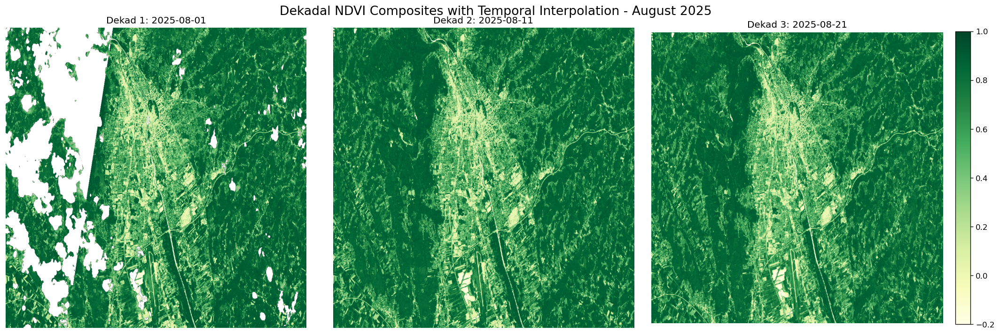

In [9]:
# Cell 8 - Process and visualize dekadal NDVI
# Get dekadal NDVI with interpolation
dekadal_ndvi = request_dekadal_ndvi()

# Create visualization
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
fig.suptitle('Dekadal NDVI Composites with Temporal Interpolation - August 2025', fontsize=16)

for i, (dekad_key, dekad_info) in enumerate(dekadal_ndvi.items()):
    ax = axes[i]
    data = dekad_info['data']
    date = dekad_info['date']
    
    if data is not None:
        # Create mask for NaN values
        mask = np.isnan(data)
        valid_data = np.ma.array(data, mask=mask)
        
        # Plot
        im = ax.imshow(valid_data, cmap="YlGn", vmin=-0.2, vmax=1.0)
        ax.set_title(f'Dekad {i+1}: {date.strftime("%Y-%m-%d")}')
        ax.axis('off')
        
        # Add colorbar
        if i == 2:
            plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
        
        # Calculate statistics
        valid_pixels = np.sum(~mask)
        total_pixels = data.size
        coverage = (valid_pixels / total_pixels) * 100
        
        print(f"Dekad {i+1} ({date.strftime('%Y-%m-%d')}):")
        print(f"  - Valid pixels: {valid_pixels}/{total_pixels} ({coverage:.1f}%)")
        if valid_pixels > 0:
            print(f"  - NDVI range: [{np.nanmin(data):.3f}, {np.nanmax(data):.3f}]")
            print(f"  - NDVI mean: {np.nanmean(data):.3f}")
    else:
        ax.text(0.5, 0.5, 'No data', 
                horizontalalignment='center', 
                verticalalignment='center',
                transform=ax.transAxes,
                fontsize=14)
        ax.set_title(f'Dekad {i+1}: {date.strftime("%Y-%m-%d")}')
        ax.axis('off')

plt.tight_layout()
plt.show()

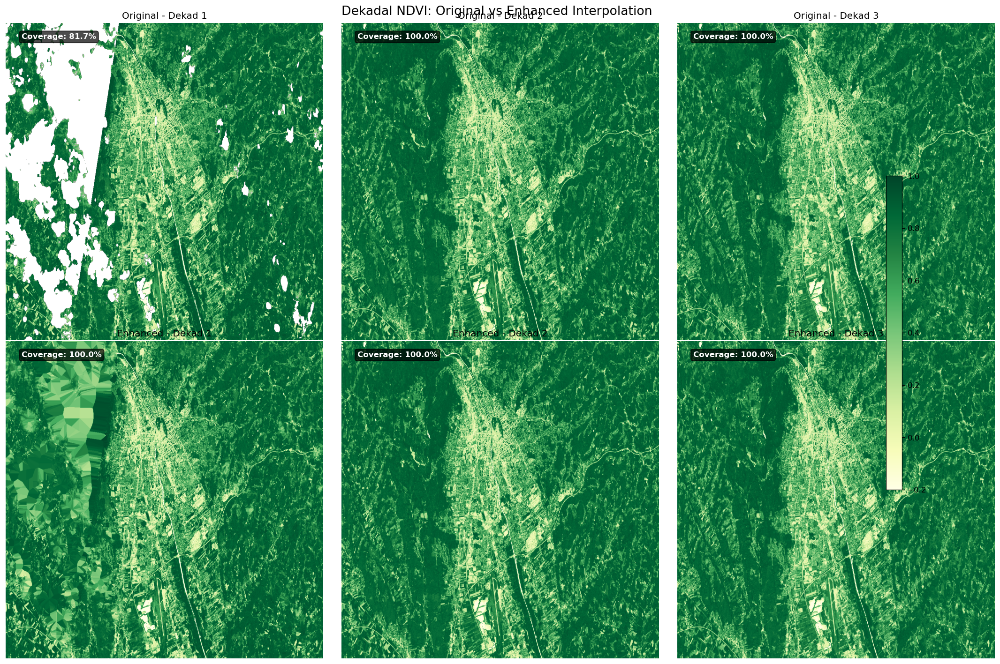

In [10]:
# Cell 9 - Enhanced interpolation with gap filling
def enhanced_interpolation(dekadal_data):
    """
    Apply enhanced interpolation to fill gaps in dekadal data
    Uses spatial interpolation for missing pixels
    """
    from scipy import ndimage
    import numpy as np
    
    enhanced_data = {}
    
    for dekad_key, dekad_info in dekadal_data.items():
        data = dekad_info['data']
        
        if data is None:
            enhanced_data[dekad_key] = dekad_info
            continue
        
        # Create mask of NaN values
        mask = np.isnan(data)
        
        if np.sum(~mask) == 0:  # All pixels are NaN
            enhanced_data[dekad_key] = dekad_info
            continue
        
        # Fill NaN values using nearest neighbor interpolation
        # First, get indices of valid pixels
        indices = ndimage.distance_transform_edt(
            mask, return_distances=False, return_indices=True
        )
        
        # Create interpolated data
        interpolated_data = data.copy()
        
        # Fill NaN values with nearest valid neighbor
        if np.any(mask):
            interpolated_data[mask] = data[tuple(indices[:, mask])]
        
        # Apply smoothing filter to reduce artifacts
        from scipy.ndimage import gaussian_filter
        smoothed_data = gaussian_filter(interpolated_data, sigma=0.5)
        
        # Keep original valid values, use smoothed only for interpolated areas
        final_data = np.where(mask, smoothed_data, data)
        
        enhanced_data[dekad_key] = {
            'date': dekad_info['date'],
            'data': final_data,
            'original_data': data,
            'interpolated_mask': mask
        }
    
    return enhanced_data

# Apply enhanced interpolation
enhanced_ndvi = enhanced_interpolation(dekadal_ndvi)

# Visualize enhanced results
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
fig.suptitle('Dekadal NDVI: Original vs Enhanced Interpolation', fontsize=16)

for i, (dekad_key, dekad_info) in enumerate(enhanced_ndvi.items()):
    # Original data
    ax1 = axes[0, i]
    data = dekad_info.get('original_data', dekad_info['data'])
    
    if data is not None:
        mask = np.isnan(data)
        valid_data = np.ma.array(data, mask=mask)
        im1 = ax1.imshow(valid_data, cmap="YlGn", vmin=-0.2, vmax=1.0)
        ax1.set_title(f'Original - Dekad {i+1}')
        ax1.axis('off')
        
        # Calculate coverage
        coverage = (np.sum(~mask) / data.size) * 100
        ax1.text(0.05, 0.95, f'Coverage: {coverage:.1f}%', 
                transform=ax1.transAxes, 
                color='white', fontweight='bold',
                bbox=dict(boxstyle="round,pad=0.3", facecolor="black", alpha=0.7))
    
    # Enhanced data
    ax2 = axes[1, i]
    enhanced_data = dekad_info['data']
    
    if enhanced_data is not None:
        im2 = ax2.imshow(enhanced_data, cmap="YlGn", vmin=-0.2, vmax=1.0)
        ax2.set_title(f'Enhanced - Dekad {i+1}')
        ax2.axis('off')
        
        # Calculate improved coverage
        coverage_enhanced = (np.sum(~np.isnan(enhanced_data)) / enhanced_data.size) * 100
        ax2.text(0.05, 0.95, f'Coverage: {coverage_enhanced:.1f}%', 
                transform=ax2.transAxes, 
                color='white', fontweight='bold',
                bbox=dict(boxstyle="round,pad=0.3", facecolor="black", alpha=0.7))

# Add colorbar
plt.colorbar(im2, ax=axes.ravel().tolist(), fraction=0.02, pad=0.04)
plt.tight_layout()
plt.show()

## Exporting Results as Geospatial Files

This final cell provides two robust methods for exporting the processed dekadal NDVI data into standard, reusable formats. Exporting the data correctly is crucial to ensure the results can be used in Geographic Information Systems (GIS) like QGIS or ArcGIS, or in other Python scripts for further analysis.

**Method 1: Export as a Multi-Band GeoTIFF using GDAL**

The first function, `save_as_geotiff`, packages all three dekadal composites into a single, multi-band GeoTIFF file. This is an industry-standard format that embeds all necessary geospatial information directly into the file.

**What it does and why it's important:**

1.  **Creates a GeoTIFF Structure**: It uses the GDAL library's `Driver` to create a new GeoTIFF file with specified dimensions and data type (`GDT_Float32` for precision).
2.  **Defines the Spatial Reference System (SRS)**: It explicitly sets the coordinate system to EPSG:4326 (WGS84), which is the standard latitude/longitude system used by the Sentinel-2 data and our AOI definition. This tells any GIS *where on Earth* the image is located.
3.  **Calculates and Sets the Geotransform**: This is a critical step for georeferencing. The geotransform is a set of six coefficients that map pixel/line coordinates (row, column) to geospatial coordinates (X, Y). It is calculated from the AOI's bounding box and the image's pixel dimensions.
4.  **Writes Data and Metadata**: Each dekadal composite is written as a separate band in the file. Crucially, each band is tagged with descriptive metadata (e.g., "NDVI Dekad 1 (2025-08-01)") and the `NoDataValue` is set to `-9999` to identify pixels with no valid data.

The result, `dekadal_ndvi_august_2025.tif`, is a self-contained, analysis-ready product where Band 1 = Dekad 1, Band 2 = Dekad 2, and Band 3 = Dekad 3.
<br>

**Method 2: Robust Export with Rasterio/Numpy Fallback**

The `export_images_workaround` function offers a more flexible and fault-tolerant export strategy. It was designed to handle library dependency conflicts (like the PROJ version error you encountered) by providing multiple export pathways.


In [20]:
# Cell 10 - Export as GeoTIFF
from osgeo import gdal, osr
import os

def save_as_geotiff(data_dict, output_path="dekadal_ndvi.tif"):
    """
    Save dekadal NDVI data as multi-band GeoTIFF
    Each band represents one dekad
    """
    # Get first valid data array for metadata
    first_valid = None
    for dekad_info in data_dict.values():
        if dekad_info['data'] is not None:
            first_valid = dekad_info['data']
            break
    
    if first_valid is None:
        print("No valid data to export")
        return
    
    # Create output directory if it doesn't exist
    os.makedirs(os.path.dirname(output_path), exist_ok=True)
    
    # Get dimensions
    height, width = first_valid.shape
    
    # Create GeoTIFF
    driver = gdal.GetDriverByName('GTiff')
    out_ds = driver.Create(output_path, width, height, 3, gdal.GDT_Float32)
    
    # Set spatial reference (WGS84)
    srs = osr.SpatialReference()
    srs.ImportFromEPSG(4326)
    out_ds.SetProjection(srs.ExportToWkt())
    
    # Set geotransform (using AOI bounds)
    # Note: This is simplified - in production, you'd calculate exact transform
    left, bottom, right, top = aoi.bbox
    x_res = (right - left) / width
    y_res = (top - bottom) / height
    geotransform = (left, x_res, 0, top, 0, -y_res)
    out_ds.SetGeoTransform(geotransform)
    
    # Write each dekad as a band
    for i, (dekad_key, dekad_info) in enumerate(data_dict.items()):
        band_idx = i + 1
        data = dekad_info['data']
        
        if data is not None:
            out_band = out_ds.GetRasterBand(band_idx)
            out_band.WriteArray(data)
            out_band.SetNoDataValue(-9999)
            
            # Set band metadata
            date_str = dekad_info['date'].strftime('%Y-%m-%d')
            out_band.SetDescription(f"NDVI Dekad {band_idx} ({date_str})")
            out_band.SetMetadata({
                'Dekad': str(band_idx),
                'Date': date_str,
                'Units': 'NDVI',
                'Valid_range': '-1 to 1'
            })
    
    # Close dataset
    out_ds = None
    
    print(f"GeoTIFF saved to: {output_path}")
    print("Bands:")
    for i, dekad_key in enumerate(data_dict.keys()):
        dekad_info = data_dict[dekad_key]
        date_str = dekad_info['date'].strftime('%Y-%m-%d')
        print(f"  Band {i+1}: {dekad_key} ({date_str})")

# Save the enhanced data
save_as_geotiff(enhanced_ndvi, "output/dekadal_ndvi_august_2025.tif")

ERROR 1: Cannot open TIFF image


GeoTIFF saved to: output/dekadal_ndvi_august_2025.tif
Bands:
  Band 1: dekad_1 (2025-08-01)
  Band 2: dekad_2 (2025-08-11)
  Band 3: dekad_3 (2025-08-21)


In [22]:
def export_images_workaround(data_dict, aoi_geometry, output_dir="output/safe_images"):
    """
    Export images as GeoTIFF without CRS to bypass the PROJ error (I had an error with that).
    You can add the spatial reference later.
    """
    # Create output directory
    os.makedirs(output_dir, exist_ok=True)
    
    # Try importing rasterio, but handle it carefully
    try:
        import rasterio
        from rasterio.transform import from_bounds
        HAS_RASTERIO = True
    except ImportError:
        print("Warning: rasterio not found. Saving as .npy files instead.")
        HAS_RASTERIO = False
    
    # Get bounding box (we'll still calculate transform for when rasterio works)
    left, bottom, right, top = aoi_geometry.bbox
    
    for i, (dekad_key, dekad_info) in enumerate(data_dict.items()):
        date = dekad_info['date']
        date_str = date.strftime('%Y%m%d')
        
        # Get original and enhanced data
        original_data = dekad_info.get('original_data')
        enhanced_data = dekad_info.get('data')
        
        if original_data is None or enhanced_data is None:
            print(f"Warning: No data for {dekad_key}, skipping.")
            continue
        
        # Get image shape
        height, width = original_data.shape
        
        # Option 1: Try to use rasterio WITHOUT CRS (may still fail)
        if HAS_RASTERIO:
            try:
                # Try creating transform (even if we can't use CRS)
                transform = from_bounds(left, bottom, right, top, width, height)
                
                # Export ORIGINAL - try without CRS first
                original_path = os.path.join(output_dir, f"dekad_{i+1}_{date_str}_original_notif.tif")
                print(f"Attempting to export (no CRS): {original_path}")
                
                # The key is to NOT specify 'crs' parameter
                with rasterio.open(
                    original_path,
                    'w',
                    driver='GTiff',
                    height=height,
                    width=width,
                    count=1,
                    dtype=np.float32,
                    transform=transform,  # Has georeferencing but no CRS
                    nodata=-9999.0,
                    compress='lzw'
                ) as dst:
                    original_filled = np.where(np.isnan(original_data), -9999.0, original_data)
                    dst.write(original_filled, 1)
                    # Add CRS information as a tag instead
                    dst.update_tags(CRS_INFO="EPSG:4326 (WGS84) - To be added after PROJ fix")
                
                print(f"  ✓ Saved (no CRS)")
                
            except Exception as e:
                print(f"  ✗ Rasterio failed: {str(e)[:100]}...")
                HAS_RASTERIO = False  # Fall back to numpy
        
        # Option 2: Fallback to numpy format
        if not HAS_RASTERIO:
            # Save as numpy array with metadata
            for data_type, data, suffix in [("original", original_data, "original"), 
                                           ("enhanced", enhanced_data, "enhanced")]:
                filename = f"dekad_{i+1}_{date_str}_{suffix}.npy"
                filepath = os.path.join(output_dir, filename)
                
                # Create metadata dictionary
                metadata = {
                    'date': date_str,
                    'dekad': i+1,
                    'type': suffix,
                    'bbox': [left, bottom, right, top],
                    'shape': data.shape,
                    'crs_intended': 'EPSG:4326',
                    'nodata': -9999.0
                }
                
                # Save data and metadata
                np.save(filepath, data)
                
                # Save metadata as JSON
                metadata_path = os.path.join(output_dir, f"dekad_{i+1}_{date_str}_{suffix}_metadata.json")
                import json
                with open(metadata_path, 'w') as f:
                    json.dump(metadata, f, indent=2)
                
                print(f"  ✓ Saved as numpy: {filename}")
                print(f"    Metadata: {metadata_path}")
    
    print(f"\n{'='*60}")
    if HAS_RASTERIO:
        print("✓ Images saved as GeoTIFF (without CRS)")
        print("  You can add CRS later using QGIS or after fixing PROJ")
    else:
        print("✓ Images saved as .npy files with metadata")
        print("  Load with: data = np.load('filename.npy')")
    print(f"  Location: {os.path.abspath(output_dir)}")
    print(f"{'='*60}")

# Run the workaround
export_images_workaround(enhanced_ndvi, aoi, "output/workaround_save")

Attempting to export (no CRS): output/workaround_save/dekad_1_20250801_original_notif.tif
  ✓ Saved (no CRS)
Attempting to export (no CRS): output/workaround_save/dekad_2_20250811_original_notif.tif
  ✓ Saved (no CRS)
Attempting to export (no CRS): output/workaround_save/dekad_3_20250821_original_notif.tif
  ✓ Saved (no CRS)

✓ Images saved as GeoTIFF (without CRS)
  You can add CRS later using QGIS or after fixing PROJ
  Location: /Users/juanfernandezmartinez/Downloads/GSE Planet/output/workaround_save
